# ⚠️ Auto-generated Notebook
    
This notebook is automatically compiled from source files in `/workspaces/awesome-matrix/src/examples/12_visualization_techniques`.
**Do not edit this file directly** as your changes will be overwritten.

To make changes:
1. Edit the source file `/workspaces/awesome-matrix/src/examples/12_visualization_techniques/03_applications.py` instead
2. Run the compile script to regenerate this notebook

See [COMPILE.md](docs/COMPILE.md) for more information.


# Applications of Matrix Visualization Techniques

In this notebook, we'll explore practical applications of matrix and tensor visualization techniques across different fields. Effective visualization is crucial for understanding complex mathematical concepts and communicating insights in data-driven disciplines.

We'll explore applications in:

1. Machine Learning - Visualizing weights, activations, and attention mechanisms
2. Image Processing - Exploring filters and transformations
3. Network Analysis - Visualizing graph structures and relationships
4. Animation - Creating dynamic visualizations of matrix processes
5. Dimensionality Reduction - Visualizing high-dimensional data


In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.animation as animation
from IPython.display import HTML
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import networkx as nx

# Set style for plots
plt.style.use('ggplot')
sns.set(style="whitegrid", font_scale=1.2)

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)


## 1. Machine Learning Applications

Matrices are fundamental in machine learning - from weight matrices in neural networks to covariance matrices in statistical models. Let's explore some visualization techniques for machine learning applications.


### Visualizing Neural Network Weights

Weight matrices connect layers in neural networks. Visualizing them can help us understand what the network is learning.


In [2]:
# Create a simple neural network
class SimpleNN(torch.nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(SimpleNN, self).__init__()
        self.layer1 = torch.nn.Linear(input_size, hidden_size)
        self.relu = torch.nn.ReLU()
        self.layer2 = torch.nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        x = self.layer1(x)
        x = self.relu(x)
        x = self.layer2(x)
        return x

# Create a simple network for MNIST (28x28 images, 10 classes)
input_size = 28 * 28
hidden_size = 64
output_size = 10
model = SimpleNN(input_size, hidden_size, output_size)

# Get the weight matrices
W1 = model.layer1.weight.detach()
W2 = model.layer2.weight.detach()

print(f"Layer 1 weight shape: {W1.shape}")
print(f"Layer 2 weight shape: {W2.shape}")


Layer 1 weight shape: torch.Size([64, 784])
Layer 2 weight shape: torch.Size([10, 64])


#### Visualizing First Layer Weights

For the first layer in image classification networks, we can reshape the weights to visualize what patterns each neuron is looking for:


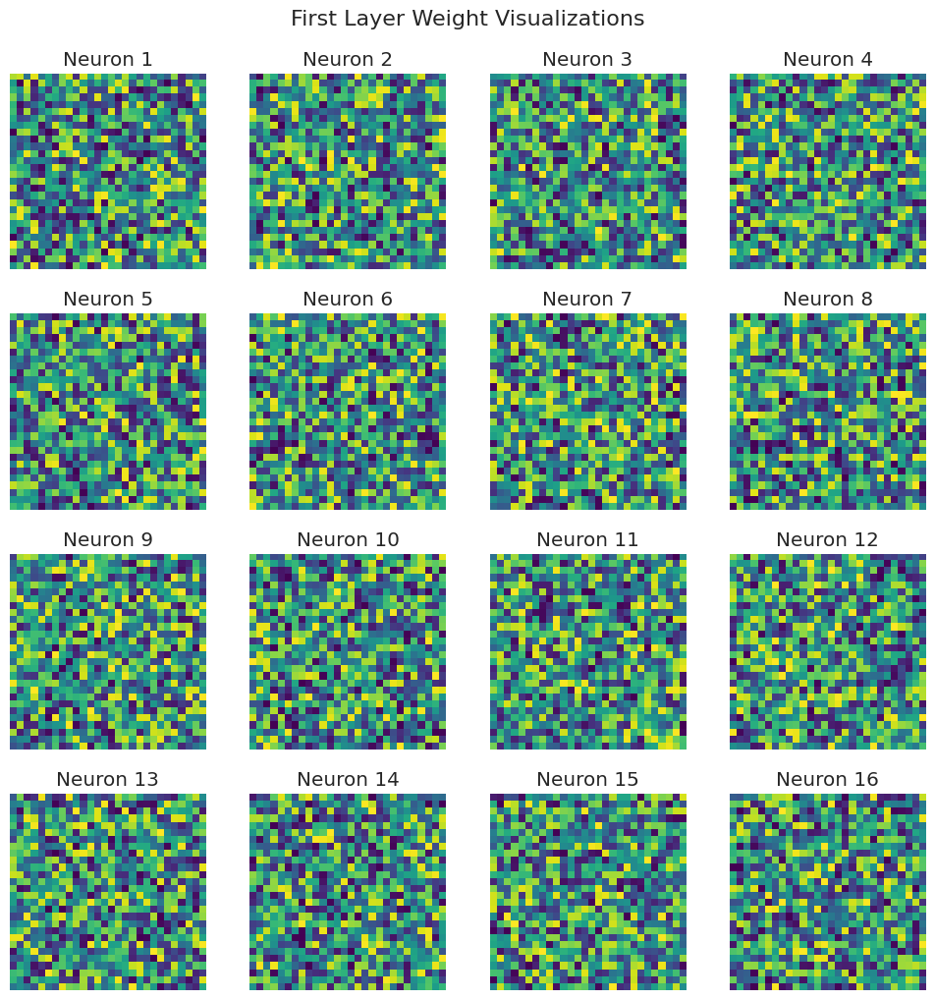

In [3]:
# Reshape weights to visualize them as images (for the first layer)
num_neurons_to_show = 16
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
axes = axes.flatten()

for i in range(num_neurons_to_show):
    # Reshape the weights for the i-th neuron into a 28x28 image
    neuron_weights = W1[i].reshape(28, 28)
    
    # Visualize
    im = axes[i].imshow(neuron_weights, cmap='viridis')
    axes[i].set_title(f"Neuron {i+1}")
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle("First Layer Weight Visualizations", y=1.02, fontsize=16)
plt.show()


#### Visualizing Weight Distributions


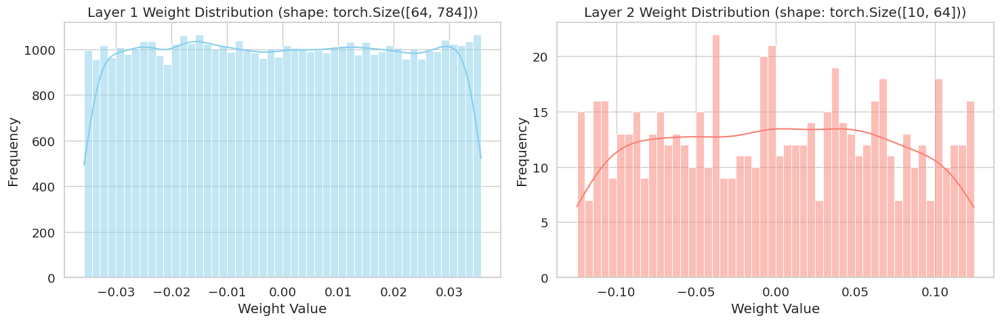

In [4]:
# Compare weight distributions between layers
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Layer 1 weights
sns.histplot(W1.numpy().flatten(), bins=50, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title(f"Layer 1 Weight Distribution (shape: {W1.shape})")
axes[0].set_xlabel("Weight Value")
axes[0].set_ylabel("Frequency")

# Layer 2 weights
sns.histplot(W2.numpy().flatten(), bins=50, kde=True, ax=axes[1], color='salmon')
axes[1].set_title(f"Layer 2 Weight Distribution (shape: {W2.shape})")
axes[1].set_xlabel("Weight Value")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


### Visualizing Attention Mechanisms

Attention mechanisms are crucial in modern deep learning, especially in NLP and computer vision. Let's visualize an attention matrix:


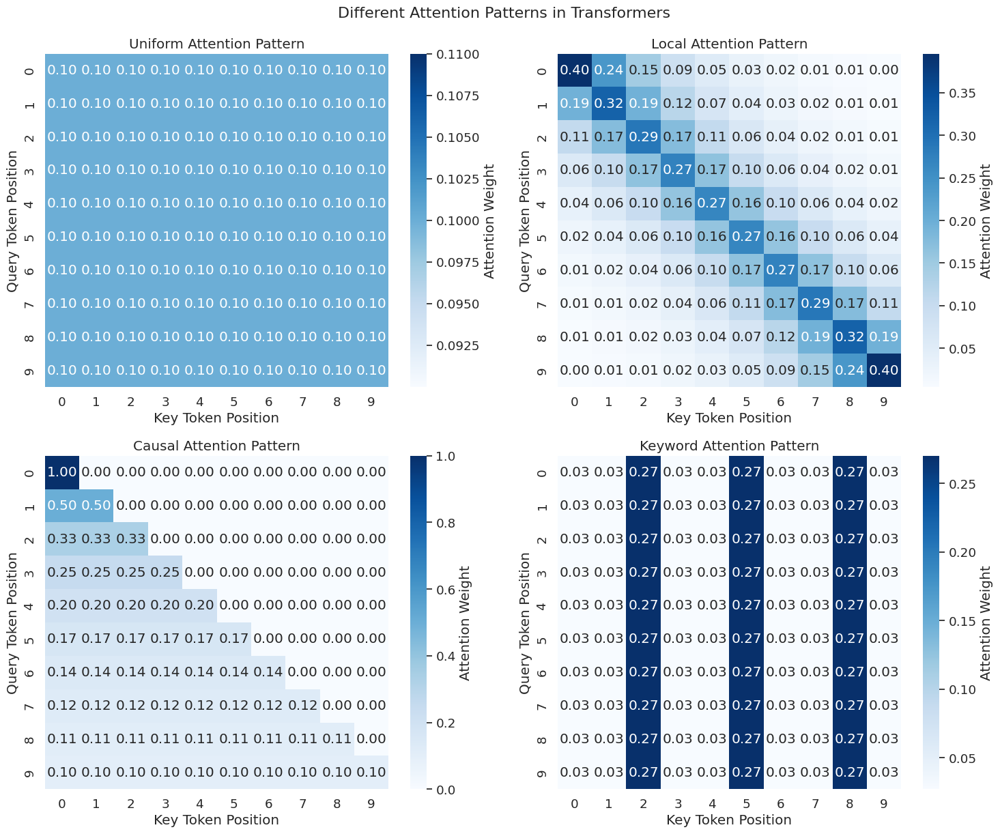

In [5]:
# Simulate an attention matrix for a sequence of 10 tokens
seq_len = 10
attention_scores = torch.zeros(seq_len, seq_len)

# Create different attention patterns
def create_attention_pattern(pattern_type, seq_len):
    if pattern_type == 'uniform':
        # Uniform attention
        return torch.ones(seq_len, seq_len) / seq_len
    
    elif pattern_type == 'local':
        # Local attention (focuses on nearby tokens)
        attn = torch.zeros(seq_len, seq_len)
        for i in range(seq_len):
            for j in range(seq_len):
                attn[i, j] = torch.exp(-torch.tensor(abs(i - j) / 2))
        # Normalize
        attn = attn / attn.sum(dim=1, keepdim=True)
        return attn
    
    elif pattern_type == 'causal':
        # Causal attention (each token attends only to itself and previous tokens)
        attn = torch.tril(torch.ones(seq_len, seq_len))
        # Normalize
        attn = attn / attn.sum(dim=1, keepdim=True)
        return attn
    
    elif pattern_type == 'keyword':
        # Keyword focus (simulating attention to important tokens)
        attn = torch.zeros(seq_len, seq_len)
        keywords = [2, 5, 8]  # Key token positions
        for i in range(seq_len):
            for j in range(seq_len):
                if j in keywords:
                    attn[i, j] = 1.0
                else:
                    attn[i, j] = 0.1
        # Normalize
        attn = attn / attn.sum(dim=1, keepdim=True)
        return attn
    
    else:
        raise ValueError(f"Unknown pattern type: {pattern_type}")

# Create different attention patterns
patterns = ['uniform', 'local', 'causal', 'keyword']
attention_matrices = {pattern: create_attention_pattern(pattern, seq_len) for pattern in patterns}

# Visualize each attention pattern
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for i, (pattern, attn) in enumerate(attention_matrices.items()):
    im = sns.heatmap(attn, annot=True, fmt=".2f", cmap='Blues', ax=axes[i], 
                cbar_kws={'label': 'Attention Weight'})
    axes[i].set_title(f"{pattern.capitalize()} Attention Pattern")
    axes[i].set_xlabel("Key Token Position")
    axes[i].set_ylabel("Query Token Position")

plt.tight_layout()
plt.suptitle("Different Attention Patterns in Transformers", y=1.02, fontsize=16)
plt.show()


### Visualizing Model Activations

Let's visualize the activations in different layers of our network:


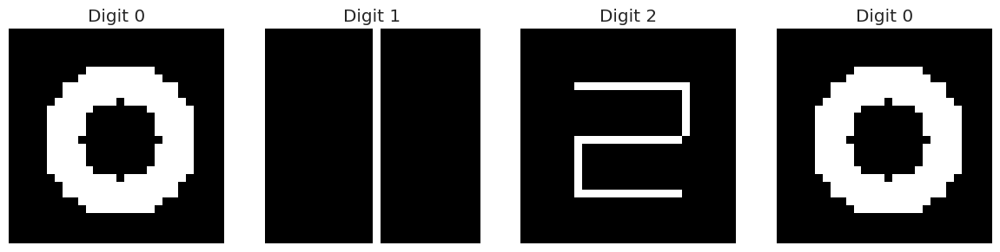

In [6]:
# Let's create some sample MNIST-like data
def generate_simple_digit(digit, size=28):
    """Generate a simple digit-like image for demonstration"""
    image = torch.zeros((size, size))
    
    if digit == 0:
        # Create a circle
        for i in range(size):
            for j in range(size):
                x, y = i - size//2, j - size//2
                if 5 < (x**2 + y**2)**0.5 < 10:
                    image[i, j] = 1.0
    
    elif digit == 1:
        # Create a vertical line
        for i in range(size):
            image[i, size//2] = 1.0
    
    elif digit == 2:
        # Create a simple '2' shape
        # Top horizontal line
        for j in range(size//4, 3*size//4):
            image[size//4, j] = 1.0
        # Bottom horizontal line
        for j in range(size//4, 3*size//4):
            image[3*size//4, j] = 1.0
        # Middle horizontal line
        for j in range(size//4, 3*size//4):
            image[size//2, j] = 1.0
        # Top-right vertical line
        for i in range(size//4, size//2):
            image[i, 3*size//4] = 1.0
        # Bottom-left vertical line
        for i in range(size//2, 3*size//4):
            image[i, size//4] = 1.0
    
    else:
        # Random noise for other digits
        image = torch.rand((size, size)) > 0.8
        image = image.float()
    
    return image

# Generate a batch of simple digits
batch_size = 4
images = torch.stack([generate_simple_digit(i % 3) for i in range(batch_size)])
inputs = images.view(batch_size, -1)  # Flatten for the model

# Plot the generated images
fig, axes = plt.subplots(1, batch_size, figsize=(12, 3))
for i in range(batch_size):
    axes[i].imshow(images[i], cmap='gray')
    axes[i].set_title(f"Digit {i % 3}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()


Now let's pass these images through our model and visualize the activations at each layer:


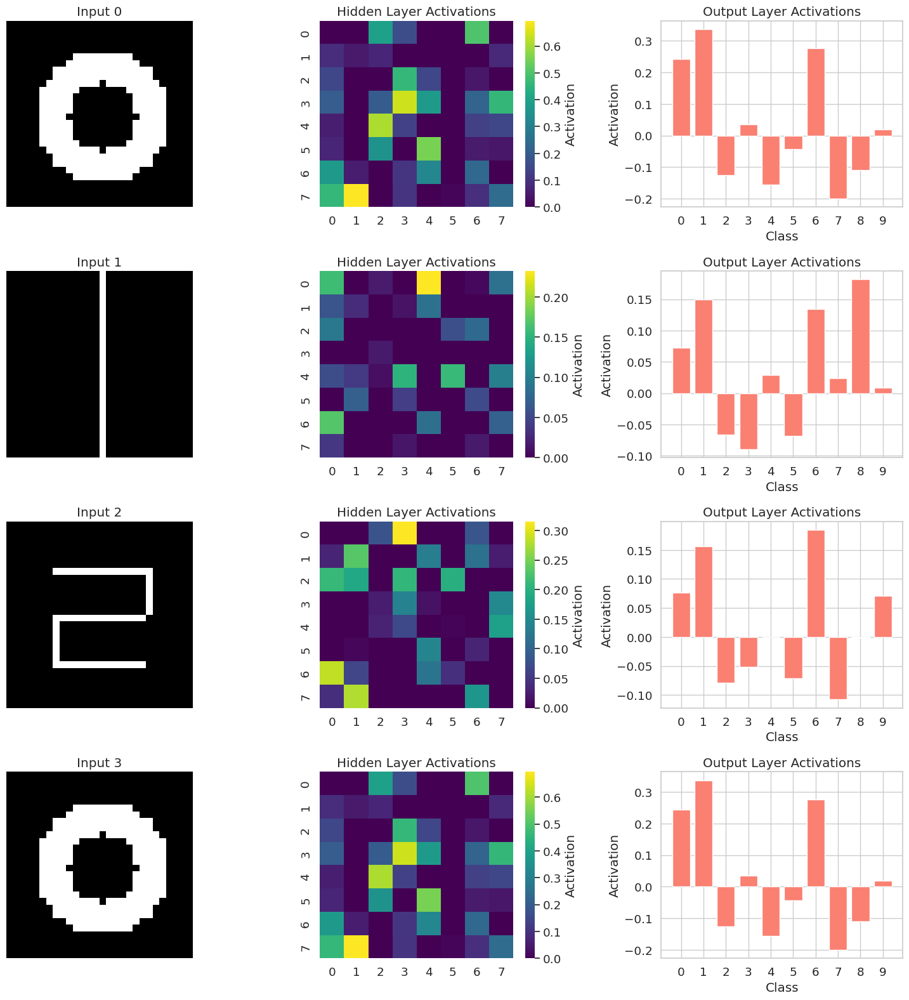

In [7]:
# Forward pass through the model
with torch.no_grad():
    # First layer activations (pre-ReLU)
    layer1_pre = model.layer1(inputs)
    
    # First layer activations (post-ReLU)
    layer1_post = model.relu(layer1_pre)
    
    # Output layer activations
    output = model.layer2(layer1_post)

# Visualize activations
fig, axes = plt.subplots(batch_size, 3, figsize=(15, 4*batch_size))

for i in range(batch_size):
    # Original image
    axes[i, 0].imshow(images[i], cmap='gray')
    axes[i, 0].set_title(f"Input {i}")
    axes[i, 0].axis('off')
    
    # Layer 1 activations (heatmap of first 64 hidden units)
    im = sns.heatmap(layer1_post[i].view(8, 8), ax=axes[i, 1], cmap='viridis', 
               cbar_kws={'label': 'Activation'})
    axes[i, 1].set_title(f"Hidden Layer Activations")
    
    # Output layer activations (bar plot for 10 classes)
    axes[i, 2].bar(range(output_size), output[i], color='salmon')
    axes[i, 2].set_title(f"Output Layer Activations")
    axes[i, 2].set_xlabel("Class")
    axes[i, 2].set_ylabel("Activation")
    axes[i, 2].set_xticks(range(output_size))

plt.tight_layout()
plt.show()


## 2. Image Processing Applications

Matrices are central to image processing. Let's explore some visualization techniques for image filters and transformations.


### Visualizing Image Filters


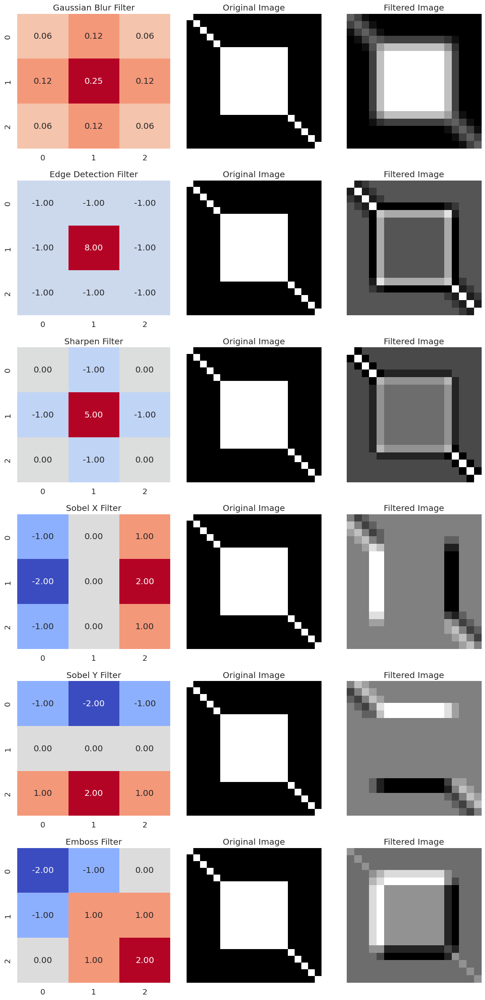

In [8]:
# Define some common image filters
filters = {
    'Gaussian Blur': torch.tensor([
        [1, 2, 1],
        [2, 4, 2],
        [1, 2, 1]
    ], dtype=torch.float32) / 16,
    
    'Edge Detection': torch.tensor([
        [-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]
    ], dtype=torch.float32),
    
    'Sharpen': torch.tensor([
        [ 0, -1,  0],
        [-1,  5, -1],
        [ 0, -1,  0]
    ], dtype=torch.float32),
    
    'Sobel X': torch.tensor([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ], dtype=torch.float32),
    
    'Sobel Y': torch.tensor([
        [-1, -2, -1],
        [ 0,  0,  0],
        [ 1,  2,  1]
    ], dtype=torch.float32),
    
    'Emboss': torch.tensor([
        [-2, -1,  0],
        [-1,  1,  1],
        [ 0,  1,  2]
    ], dtype=torch.float32)
}

# Create a simple image for demonstration
size = 20
image = torch.zeros((size, size), dtype=torch.float32)
# Add a simple shape
image[5:15, 5:15] = 1.0
# Add a diagonal line
for i in range(size):
    if 0 <= i < size:
        image[i, i] = 1.0

# Visualize filters and their effects
fig, axes = plt.subplots(len(filters), 3, figsize=(12, 4*len(filters)))

for i, (name, filter_kernel) in enumerate(filters.items()):
    # Display filter kernel
    im1 = sns.heatmap(filter_kernel, annot=True, fmt=".2f", cmap='coolwarm', center=0, 
                ax=axes[i, 0], cbar=False)
    axes[i, 0].set_title(f"{name} Filter")
    
    # Display original image
    axes[i, 1].imshow(image, cmap='gray')
    axes[i, 1].set_title("Original Image")
    axes[i, 1].axis('off')
    
    # Apply filter using convolution
    # For simplicity, we'll use a manual implementation with valid padding
    filtered_image = torch.zeros((size-2, size-2))
    for x in range(size-2):
        for y in range(size-2):
            filtered_image[x, y] = torch.sum(image[x:x+3, y:y+3] * filter_kernel)
    
    # Display filtered image
    vmin, vmax = filtered_image.min(), filtered_image.max()
    axes[i, 2].imshow(filtered_image, cmap='gray', vmin=vmin, vmax=vmax)
    axes[i, 2].set_title("Filtered Image")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


### Visualizing Image Transformation Matrices

Let's visualize how different 2D transformation matrices affect images:


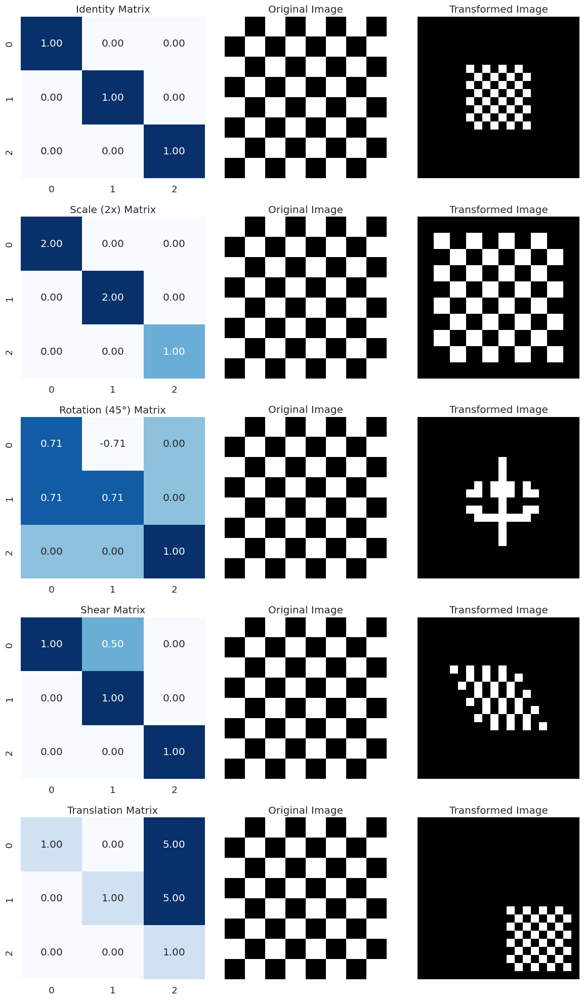

In [9]:
# Define 2D transformation matrices
transformations = {
    'Identity': torch.tensor([
        [1, 0, 0],
        [0, 1, 0],
        [0, 0, 1]
    ], dtype=torch.float32),
    
    'Scale (2x)': torch.tensor([
        [2, 0, 0],
        [0, 2, 0],
        [0, 0, 1]
    ], dtype=torch.float32),
    
    'Rotation (45°)': torch.tensor([
        [np.cos(np.pi/4), -np.sin(np.pi/4), 0],
        [np.sin(np.pi/4), np.cos(np.pi/4), 0],
        [0, 0, 1]
    ], dtype=torch.float32),
    
    'Shear': torch.tensor([
        [1, 0.5, 0],
        [0, 1, 0],
        [0, 0, 1]
    ], dtype=torch.float32),
    
    'Translation': torch.tensor([
        [1, 0, 5],
        [0, 1, 5],
        [0, 0, 1]
    ], dtype=torch.float32)
}

# Create a simple checkerboard image
checkerboard = torch.zeros((8, 8), dtype=torch.float32)
for i in range(8):
    for j in range(8):
        if (i + j) % 2 == 0:
            checkerboard[i, j] = 1.0

# Function to apply transformation to image coordinates
def apply_transform(image, transform_matrix, output_size=(20, 20)):
    h, w = image.shape
    output = torch.zeros(output_size, dtype=torch.float32)
    
    # Create coordinate grids for output image
    y_coords, x_coords = torch.meshgrid(
        torch.arange(output_size[0], dtype=torch.float32), 
        torch.arange(output_size[1], dtype=torch.float32),
        indexing='ij'  # Use 'ij' indexing to avoid warning
    )
    
    # Adjust coordinates to be centered
    x_centered = x_coords - output_size[1] // 2
    y_centered = y_coords - output_size[0] // 2
    
    # Create homogeneous coordinates [x, y, 1]
    ones = torch.ones_like(x_centered)
    coords = torch.stack([x_centered, y_centered, ones], dim=-1)
    
    # Apply inverse transform to get corresponding input coordinates
    inv_transform = torch.inverse(transform_matrix)
    
    # Manual matrix multiplication instead of einsum to avoid dtype issues
    src_coords = torch.zeros_like(coords)
    for i in range(output_size[0]):
        for j in range(output_size[1]):
            src_coords[i, j] = torch.matmul(inv_transform, coords[i, j])
    
    # Convert back to image coordinates
    src_x = src_coords[:, :, 0] + w // 2
    src_y = src_coords[:, :, 1] + h // 2
    
    # Sample from the input image (nearest neighbor interpolation for simplicity)
    valid_mask = (src_x >= 0) & (src_x < w) & (src_y >= 0) & (src_y < h)
    src_x_valid = src_x[valid_mask].long()
    src_y_valid = src_y[valid_mask].long()
    
    output[y_coords[valid_mask].long(), x_coords[valid_mask].long()] = image[src_y_valid, src_x_valid]
    
    return output

# Visualize transformations
fig, axes = plt.subplots(len(transformations), 3, figsize=(12, 4*len(transformations)))

for i, (name, transform) in enumerate(transformations.items()):
    # Display transformation matrix
    matrix_display = transform.numpy()
    im1 = sns.heatmap(matrix_display, annot=True, fmt=".2f", cmap='Blues', 
                ax=axes[i, 0], cbar=False)
    axes[i, 0].set_title(f"{name} Matrix")
    
    # Display original image
    axes[i, 1].imshow(checkerboard, cmap='gray')
    axes[i, 1].set_title("Original Image")
    axes[i, 1].axis('off')
    
    # Apply transformation
    transformed = apply_transform(checkerboard, transform)
    
    # Display transformed image
    axes[i, 2].imshow(transformed, cmap='gray')
    axes[i, 2].set_title("Transformed Image")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


## 3. Network Analysis Applications

Matrices are fundamental in network analysis and graph theory. The adjacency matrix represents connections between nodes in a graph.


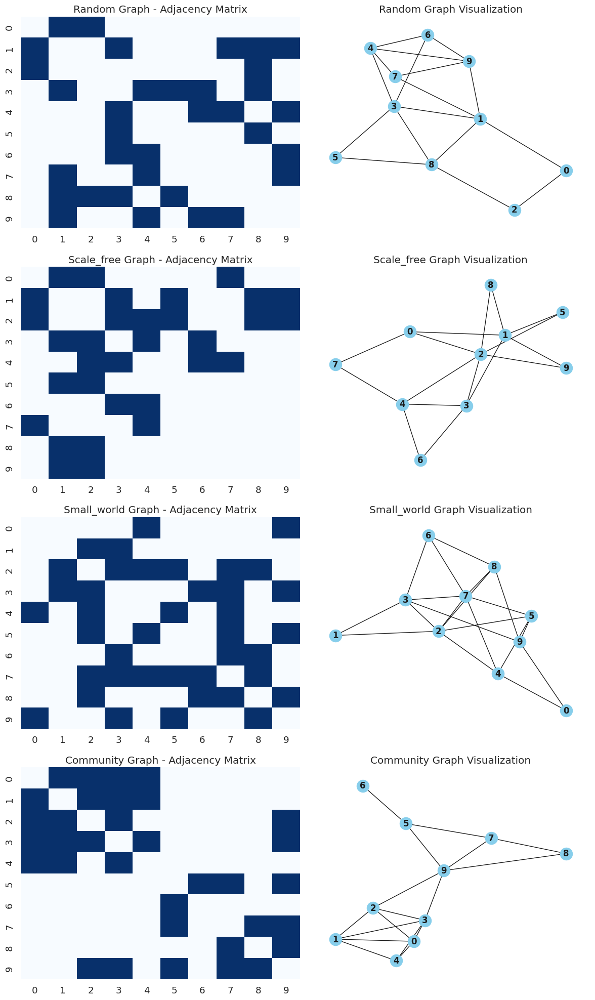

In [10]:
# Create different types of graphs
def create_graph(graph_type, n_nodes=10):
    if graph_type == 'random':
        # Random graph with 30% probability of edges
        G = nx.gnp_random_graph(n_nodes, 0.3)
    
    elif graph_type == 'scale_free':
        # Scale-free graph using Barabási-Albert model
        G = nx.barabasi_albert_graph(n_nodes, 2)  # Each new node connects to 2 existing nodes
    
    elif graph_type == 'small_world':
        # Small-world graph using Watts-Strogatz model
        G = nx.watts_strogatz_graph(n_nodes, 4, 0.3)  # 4 neighbors, 0.3 rewiring probability
    
    elif graph_type == 'community':
        # Graph with two communities
        G1 = nx.gnp_random_graph(n_nodes // 2, 0.7)
        G2 = nx.gnp_random_graph(n_nodes - n_nodes // 2, 0.7)
        G = nx.disjoint_union(G1, G2)
        # Add a few inter-community edges
        for _ in range(2):
            i = np.random.randint(0, n_nodes // 2)
            j = np.random.randint(n_nodes // 2, n_nodes)
            G.add_edge(i, j)
    
    else:
        raise ValueError(f"Unknown graph type: {graph_type}")
    
    return G

# Create different types of graphs
graph_types = ['random', 'scale_free', 'small_world', 'community']
graphs = {graph_type: create_graph(graph_type) for graph_type in graph_types}

# Visualize graphs and their adjacency matrices
fig, axes = plt.subplots(len(graphs), 2, figsize=(12, 5*len(graphs)))

for i, (graph_type, G) in enumerate(graphs.items()):
    # Get the adjacency matrix
    A = nx.to_numpy_array(G)
    
    # Plot the adjacency matrix
    im = sns.heatmap(A, cmap='Blues', ax=axes[i, 0], cbar=False)
    axes[i, 0].set_title(f"{graph_type.capitalize()} Graph - Adjacency Matrix")
    
    # Plot the graph
    nx.draw_networkx(G, ax=axes[i, 1], node_color='skyblue', node_size=300, 
                   with_labels=True, font_weight='bold')
    axes[i, 1].set_title(f"{graph_type.capitalize()} Graph Visualization")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


### Graph Centrality Measures

Let's visualize different centrality measures for a graph:


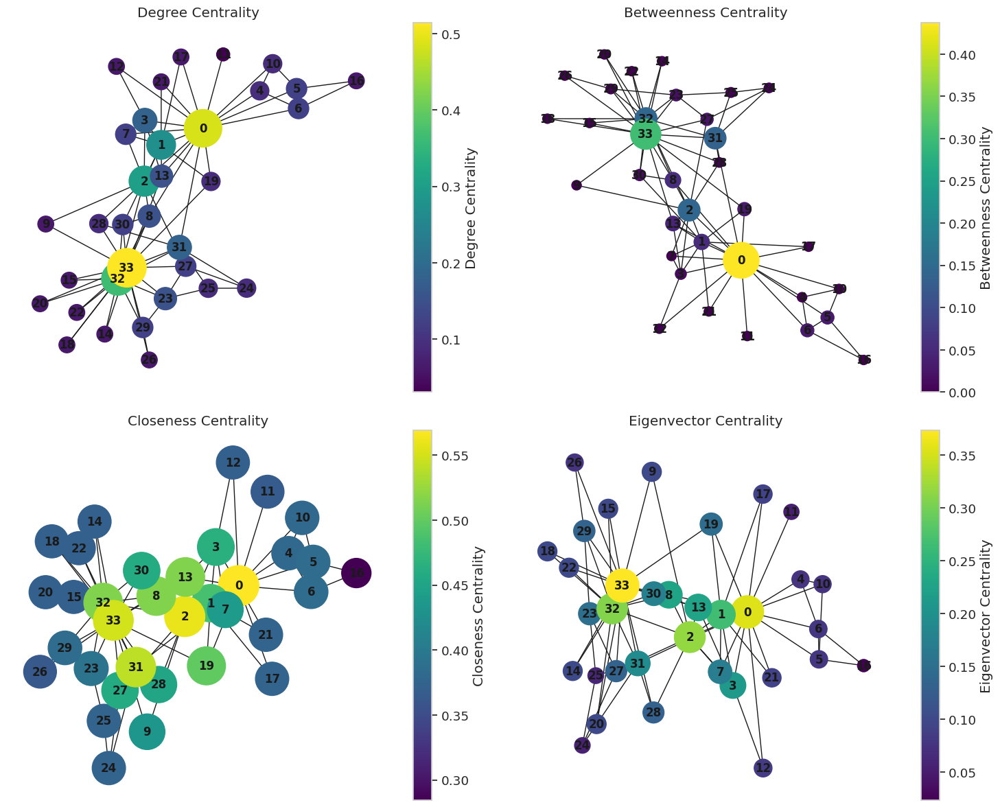

In [11]:
# Create a moderate-sized graph for centrality visualization
G = nx.karate_club_graph()  # Famous social network dataset

# Calculate different centrality measures
centrality_measures = {
    'Degree': nx.degree_centrality(G),
    'Betweenness': nx.betweenness_centrality(G),
    'Closeness': nx.closeness_centrality(G),
    'Eigenvector': nx.eigenvector_centrality(G, max_iter=1000)
}

# Visualize the graph with different centrality measures
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for i, (measure_name, centrality) in enumerate(centrality_measures.items()):
    # Node colors based on centrality
    node_colors = [centrality[node] for node in G.nodes()]
    
    # Node sizes based on centrality
    node_sizes = [3000 * centrality[node] + 100 for node in G.nodes()]
    
    # Draw the graph
    nx.draw_networkx(G, ax=axes[i], node_color=node_colors, node_size=node_sizes,
                   with_labels=True, font_weight='bold', cmap=plt.cm.viridis)
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(
        vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=axes[i])
    cbar.set_label(f"{measure_name} Centrality")
    
    axes[i].set_title(f"{measure_name} Centrality")
    axes[i].axis('off')

plt.tight_layout()
plt.show()


## 4. Animated Visualizations

Animation is powerful for visualizing dynamic processes involving matrices. Let's create some animated visualizations:


### Animated Matrix Decomposition (SVD)

Let's visualize Singular Value Decomposition (SVD) as an animation:


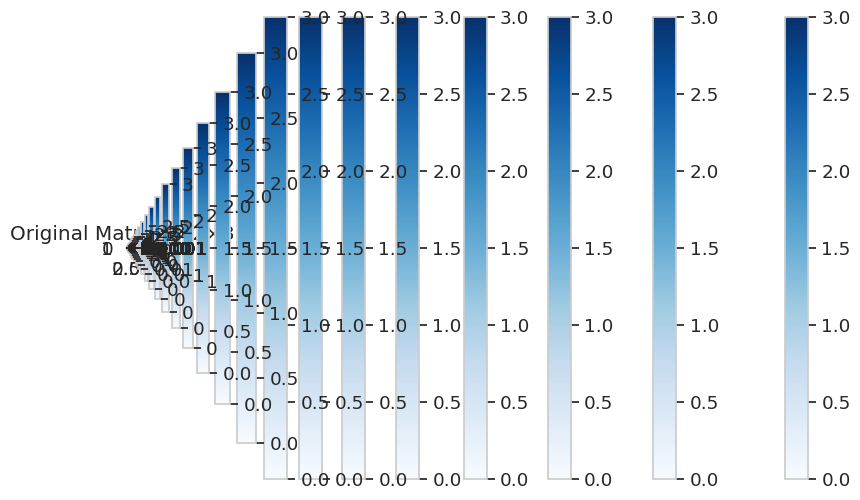

In [12]:
# Create a matrix for SVD
A = torch.tensor([
    [3.0, 2.0, 2.0],
    [2.0, 3.0, -2.0]
])

# Compute SVD: A = U * Σ * V^T
U, S, V = torch.svd(A)

# Convert to numpy for matplotlib
A_np = A.numpy()
U_np = U.numpy()
S_np = np.diag(S.numpy())
V_np = V.numpy()

# Create the animation
fig, ax = plt.subplots(figsize=(10, 6))

def update(frame):
    ax.clear()
    
    if frame < 20:
        # Show original matrix A
        t = frame / 19
        im = ax.imshow(t * A_np, cmap='Blues', vmin=0, vmax=np.max(A_np))
        ax.set_title(f"Original Matrix A ({A_np.shape[0]}×{A_np.shape[1]})")
    
    elif frame < 40:
        # Show U matrix
        t = (frame - 20) / 19
        im = ax.imshow(t * U_np, cmap='Blues', vmin=-1, vmax=1)
        ax.set_title(f"Left Singular Vectors U ({U_np.shape[0]}×{U_np.shape[1]})")
    
    elif frame < 60:
        # Show S matrix
        t = (frame - 40) / 19
        im = ax.imshow(t * S_np, cmap='Blues', vmin=0, vmax=np.max(S_np))
        ax.set_title(f"Singular Values Σ ({S_np.shape[0]}×{S_np.shape[1]})")
    
    elif frame < 80:
        # Show V^T matrix
        t = (frame - 60) / 19
        im = ax.imshow(t * V_np.T, cmap='Blues', vmin=-1, vmax=1)
        ax.set_title(f"Right Singular Vectors V^T ({V_np.T.shape[0]}×{V_np.T.shape[1]})")
    
    else:
        # Show reconstruction steps
        steps = frame - 80
        if steps == 0:
            # Full reconstruction
            reconstructed = U_np @ S_np @ V_np.T
            im = ax.imshow(reconstructed, cmap='Blues', vmin=0, vmax=np.max(A_np))
            ax.set_title("Full Reconstruction: U * Σ * V^T")
        elif steps <= min(A_np.shape):
            # Rank-k approximation
            k = steps
            Uk = U_np[:, :k]
            Sk = S_np[:k, :k]
            Vk = V_np[:, :k]
            reconstructed = Uk @ Sk @ Vk.T
            im = ax.imshow(reconstructed, cmap='Blues', vmin=0, vmax=np.max(A_np))
            ax.set_title(f"Rank-{k} Approximation")
        else:
            # Show error
            reconstructed = U_np @ S_np @ V_np.T
            error = A_np - reconstructed
            im = ax.imshow(error, cmap='coolwarm', vmin=-0.001, vmax=0.001)
            ax.set_title("Reconstruction Error (should be near zero)")
    
    # Add a colorbar
    plt.colorbar(im, ax=ax)
    
    return [im]

# Create animation
ani = animation.FuncAnimation(fig, update, frames=100, interval=100, blit=False)

# Display the animation
HTML(ani.to_jshtml())


### Animated Iterative Algorithm

Let's visualize the power iteration method for finding the dominant eigenvector:


/tmp/ipykernel_87926/1773642140.py:33: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  x = a * np.cos(theta)
/tmp/ipykernel_87926/1773642140.py:34: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y = b * np.sin(theta)


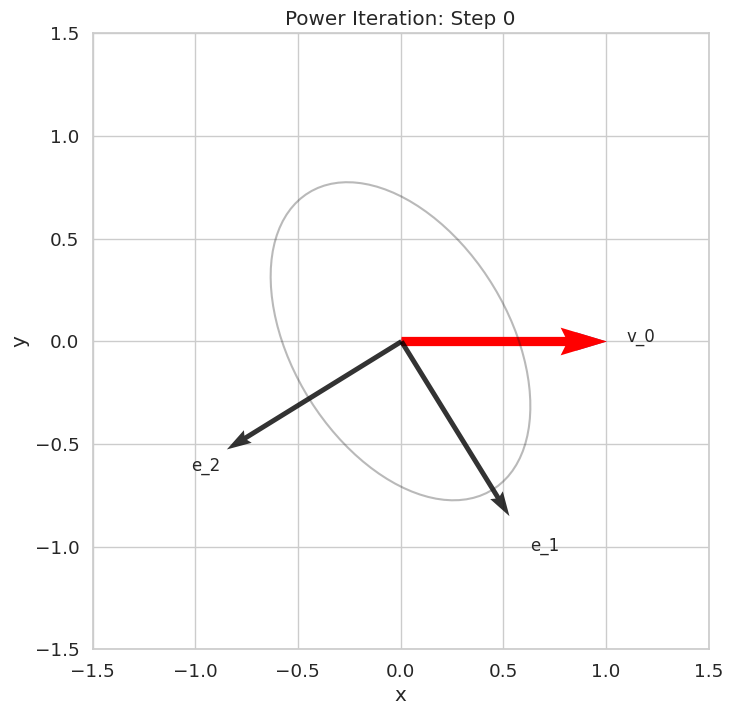

In [13]:
# Create a matrix with a dominant eigenvector
A = torch.tensor([
    [3.0, 1.0],
    [1.0, 2.0]
])

# Initialize a random vector
v = torch.tensor([1.0, 0.0])
v = v / torch.norm(v)

# Power iteration
max_iterations = 20
vectors = [v.clone()]

for _ in range(max_iterations):
    v_new = A @ v
    v_new = v_new / torch.norm(v_new)
    vectors.append(v_new.clone())
    v = v_new

# Create animation
fig, ax = plt.subplots(figsize=(8, 8))

def update(frame):
    ax.clear()
    
    # Draw the ellipse representing the quadratic form x^T A x = 1
    eigenvalues, eigenvectors = torch.linalg.eigh(A)
    a = 1 / torch.sqrt(eigenvalues[0])
    b = 1 / torch.sqrt(eigenvalues[1])
    
    theta = np.linspace(0, 2*np.pi, 100)
    x = a * np.cos(theta)
    y = b * np.sin(theta)
    
    # Rotate according to eigenvectors
    xy = np.vstack([x, y])
    xy = eigenvectors.numpy() @ xy
    
    ax.plot(xy[0, :], xy[1, :], 'k-', alpha=0.3)
    
    # Plot previous vectors
    for i in range(min(frame+1, len(vectors))):
        v = vectors[i]
        ax.quiver(0, 0, v[0], v[1], angles='xy', scale_units='xy', scale=1, 
                 color=plt.cm.viridis(i/len(vectors)), width=0.01, alpha=0.7)
    
    # Highlight current vector
    if frame < len(vectors):
        v = vectors[frame]
        ax.quiver(0, 0, v[0], v[1], angles='xy', scale_units='xy', scale=1, 
                 color='red', width=0.015)
        ax.text(v[0]*1.1, v[1]*1.1, f"v_{frame}", fontsize=12)
    
    # Draw the eigenvectors
    for i, eigenvector in enumerate(eigenvectors.T):
        ax.quiver(0, 0, eigenvector[0], eigenvector[1], angles='xy', scale_units='xy', scale=1, 
                 color='black', width=0.008, alpha=0.8)
        ax.text(eigenvector[0]*1.2, eigenvector[1]*1.2, f"e_{i+1}", fontsize=12)
    
    # Set limits and labels
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(f"Power Iteration: Step {frame}")
    ax.set_aspect('equal')
    ax.grid(True)
    
    return ax.collections + ax.lines + ax.texts

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(vectors)+5, interval=500, blit=False)

# Display the animation
HTML(ani.to_jshtml())


## 5. Dimensionality Reduction Visualization

Dimensionality reduction techniques help visualize high-dimensional data. Let's explore some visualizations:


/tmp/ipykernel_87926/2044345928.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


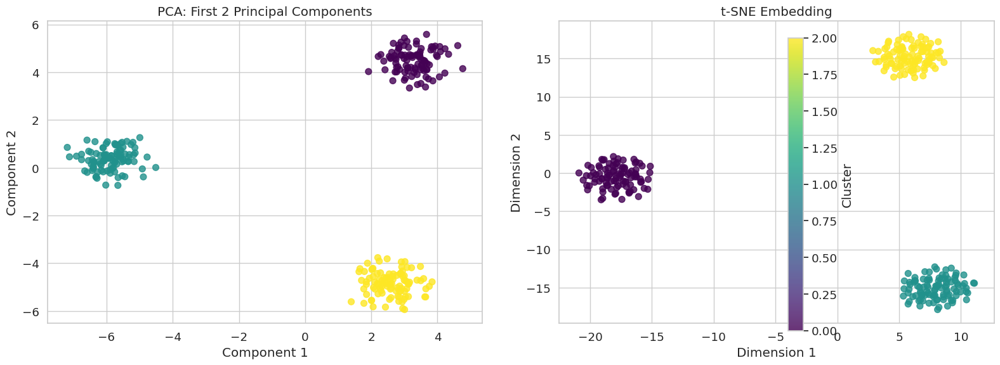

In [14]:
# Generate a synthetic dataset with clusters
def generate_clustered_data(n_samples=300, n_features=50, n_clusters=3):
    # Generate cluster centers
    centers = np.random.randn(n_clusters, n_features)
    
    # Generate samples around centers
    X = np.zeros((n_samples, n_features))
    y = np.zeros(n_samples)
    
    samples_per_cluster = n_samples // n_clusters
    
    for i in range(n_clusters):
        start_idx = i * samples_per_cluster
        end_idx = start_idx + samples_per_cluster
        
        # Generate samples with noise
        X[start_idx:end_idx] = centers[i] + np.random.randn(samples_per_cluster, n_features) * 0.5
        y[start_idx:end_idx] = i
    
    return X, y

# Generate data
X, y = generate_clustered_data(n_samples=300, n_features=50, n_clusters=3)

# Apply dimensionality reduction
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, random_state=42)

X_pca = pca.fit_transform(X)
X_tsne = tsne.fit_transform(X)

# Visualize the results
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA plot
scatter1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', s=50, alpha=0.8)
axes[0].set_title("PCA: First 2 Principal Components")
axes[0].set_xlabel("Component 1")
axes[0].set_ylabel("Component 2")
axes[0].grid(True)

# t-SNE plot
scatter2 = axes[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='viridis', s=50, alpha=0.8)
axes[1].set_title("t-SNE Embedding")
axes[1].set_xlabel("Dimension 1")
axes[1].set_ylabel("Dimension 2")
axes[1].grid(True)

# Add a colorbar
cbar = plt.colorbar(scatter1, ax=axes)
cbar.set_label('Cluster')

plt.tight_layout()
plt.show()


### PCA Component Visualization

Let's visualize the principal components as directions of maximum variance:


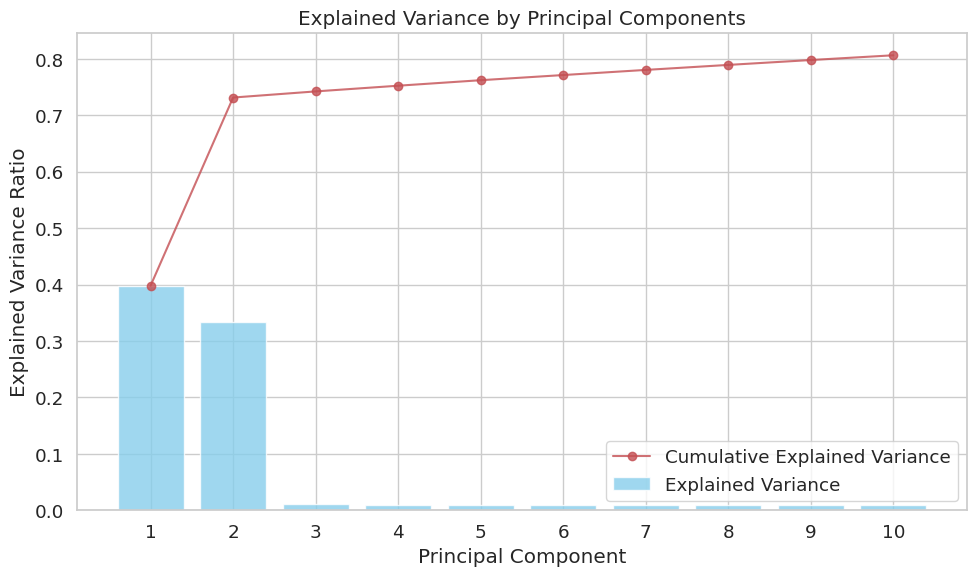

In [15]:
# Apply PCA
pca = PCA(n_components=10)
pca.fit(X)

# Get principal components and explained variance
components = pca.components_
explained_variance = pca.explained_variance_
explained_variance_ratio = pca.explained_variance_ratio_

# Visualize explained variance
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio)+1), explained_variance_ratio, 
      alpha=0.8, color='skyblue')
plt.plot(range(1, len(explained_variance_ratio)+1), 
       np.cumsum(explained_variance_ratio), 'r-o', alpha=0.8)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.xticks(range(1, len(explained_variance_ratio)+1))
plt.grid(True)
plt.legend(['Cumulative Explained Variance', 'Explained Variance'])
plt.tight_layout()
plt.show()


## Summary

In this notebook, we've explored various applications of matrix visualization techniques across different domains:

1. **Machine Learning**: Visualizing neural network weights, activations, and attention mechanisms
2. **Image Processing**: Exploring image filters and transformations
3. **Network Analysis**: Visualizing graph structures and centrality measures
4. **Animation**: Creating dynamic visualizations of matrix decompositions and iterative algorithms
5. **Dimensionality Reduction**: Visualizing high-dimensional data in lower dimensions

These visualization techniques provide powerful tools for understanding complex mathematical concepts and gaining insights from data. By mastering these visualization methods, we can better communicate results, debug algorithms, and develop intuition for n-dimensional thinking.